In [2]:
#importing libraries
from pandas_datareader import data as web
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
!pip install yfinance
pip install bar_chart_race
import yfinance as yfin
yfin.pdr_override()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 KB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 KB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 49.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 KB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.2/112.2 KB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 10.3 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.25.1
    Uninstalling requests-2.25.1:
      Successfully uninstalled requests-2.25.1
  Attempting uninstall: html5lib
    Found existing installation: html5lib 1.0.1
    Uninstalling html5lib-1.0.1:
      Successfully uninstalled html5lib-1.0.1
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.6.3
  

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 KB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 62.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 71.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6


In [5]:
#Tickers
# remove emc to create a homomgenous return
SnP = [ 'AAPL','ABBV','ABT','ACN','AIG','ALL','AMGN','AMZN','AXP','BA','BAC']
#assets = ['META','AMZN', 'AAPL','NFLX','GOOG']
assets = SnP

#Initialize the dates:
StockStartDate = '2013-01-01'
StockEndDate = datetime.today().strftime('%Y-%m-%d')

In [7]:
#Create dataframe for "ADJ CLOSE" of the stocks
df = pd.DataFrame()

#Store the adj close

for stock in assets:
  df[stock] = pdr.get_data_yahoo(stock, start = StockStartDate, end = StockEndDate)['Adj Close']

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [8]:
df

,AAPL,ABBV,ABT,ACN,AIG,ALL,AMGN,AMZN,AXP,BA,BAC
Date,,,,,,,,,,,
2013-01-02,16.862823,23.325550,26.521122,57.524624,29.553602,33.431538,68.821228,12.865500,51.072037,64.583862,10.222143
2013-01-03,16.649975,23.132946,27.530661,57.316380,29.310574,33.772682,68.388885,12.924000,51.289356,64.919052,10.162662
2013-01-04,16.186205,22.840706,27.365171,57.632912,29.407782,34.276272,68.689964,12.957500,51.819637,65.103394,10.290118
2013-01-07,16.090992,22.887199,27.588594,57.383030,29.108036,33.902634,68.342598,13.423000,52.036972,63.796135,10.273127
2013-01-08,16.134287,22.389072,27.596859,57.716202,28.881201,33.975739,68.049232,13.319000,52.332531,62.120167,10.179656
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-28,126.040001,162.229996,107.830002,263.119995,62.889999,135.429993,261.420013,81.820000,144.009995,188.380005,32.770000
2022-12-29,129.610001,162.559998,110.309998,268.380005,63.630001,136.419998,263.160004,84.180000,147.320007,188.910004,33.139999
2022-12-30,129.929993,161.610001,109.790001,266.839996,63.240002,135.600006,262.640015,84.000000,147.750000,190.490005,33.119999


<function matplotlib.pyplot.show(*args, **kw)>

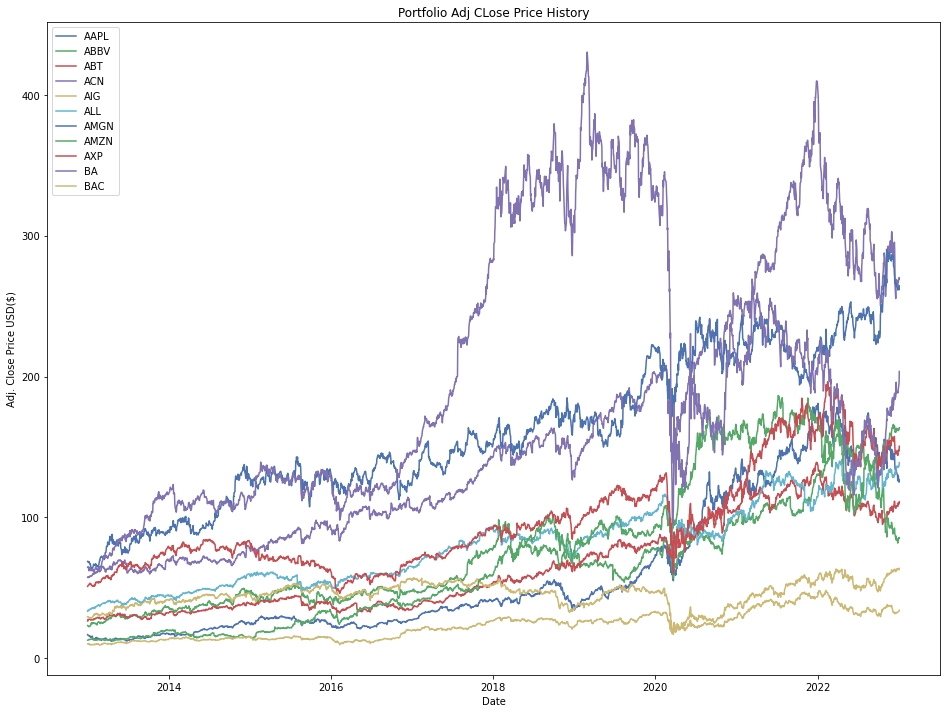

In [10]:
#visualize the path of the portfolio stocks
title = "Portfolio Adj CLose Price History"

# Get the stocks
my_stocks = df

#Create and plot the graph
plt.figure(figsize = (16,12))
for c in my_stocks.columns.values:
  plt.plot(my_stocks[c], label = c)

plt.title(title)
plt.xlabel("Date")
plt.ylabel("Adj. Close Price USD($)")
plt.legend(my_stocks.columns.values, loc = "upper left")
plt.show

In [14]:
import bar_chart_race as bcr
bcr.bar_chart_race(df = df)